# Projet P6 - Classifiez automatiquement des biens de consommation
*OPENCLASSROOMS - Parcours Data Scientist - Adeline Le Ray - 05/2024*
<hr>

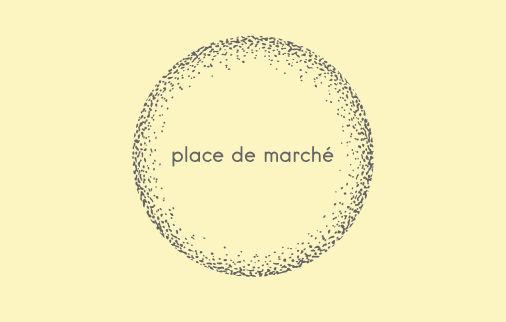

## <font color='#46abe6'>Contexte</font>
Place de marché est un site de e-commerce où des vendeurs proposent des articles à des acheteurs en postant une photo et une description.
 
ACtuellement, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.
 
Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle,  il devient nécessaire d'automatiser cette tâche d‘attribution de la catégorie.
 
L'objectif de ce projet est d'étudier la faisablité d'un moteur de classification à partir de la description textuelle ou de l'image du produit.

Cette troisième partie a pour but l'analyse exploratoire des images.

## <font color='#46abe6'>Sommaire</font>

<span style='background:#46abe6'><span style='color:white'>**Partie 1 - Données textuelles - Analyse exploratoire des données**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 2 - Données textuelles - Feature extraction et faisabilité**</span></span>

<span style='background:#d5155b'><span style='color:white'>**Partie 3 - Images - Analyse exploratoire des données**</span></span>

[Importation des librairies et définition des fonctions](#1)
* [Importation des librairies](#1_1)
* [Définition des fonctions](#1_2)

[Analyse exploratoire des données](#2)
* [Importation et inspection des données](#2_1)
* [Pré-traitement](#2_2)
* [Transformation](#2_3)

[Conclusion & Perspectives](#3)

<span style='background:#46abe6'><span style='color:white'>**Partie 4 - Images - Feature extraction et faisabilité**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 5 - Images - Classification**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 6 - Images - Requête API**</span></span>

# <font color='#0a389f'>Importation librairies<a class="anchor" id="1"></a></font>

In [1]:
import numpy as np
import pandas as pd

# graphiques
import matplotlib.pyplot as plt
import seaborn as sns

import os
import time

from sklearn import preprocessing, cluster, metrics, manifold, decomposition

from matplotlib.image import imread
import imagesize
from PIL import Image, ImageOps, ImageFilter
import cv2

In [2]:
# Version python
!python --version
# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

Python 3.11.4
numpy - 1.24.4
pandas - 2.2.2
seaborn - 0.13.2
imagesize - 1.4.1
PIL.Image - 9.4.0
cv2 - 4.10.0


In [3]:
# Paramètres par défauts des graphiques
sns.set_style('whitegrid')        # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=15)     # fontsize of the axes title
plt.rc('axes', labelsize=14)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rc('font', size=13)          # controls default text sizes
width = 7
height = 5
plt.figure(figsize=(width, height))
meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'}

<Figure size 700x500 with 0 Axes>

# <font color='#0a389f'>Partie 3 - Analyse exploratoire et Nettoyage des images<a class="anchor" id="2"></a></font>

## <font color='#46abe6'>Importation et inspection des données<a class="anchor" id="2_1"></a></font>

In [4]:
# Importation des données
data = pd.read_pickle('image_data.pkl')

In [5]:
# Encodage de la main_category
le = preprocessing.LabelEncoder()
data["main_category_label"] = le.fit_transform(data["main_category"])

In [6]:
# Nombre d'images
path = 'C:/Users/Adeline/OneDrive/Documents/5-Openclassrooms/Parcours DS/P6/Dataset+projet+prétraitement+textes+images/Flipkart/Images/'
list_images = [file for file in os.listdir(path)]
print("Il y a {} images dans l'échantillon transmis.".format(len(list_images)))

Il y a 1050 images dans l'échantillon transmis.


In [7]:
# Correspondance entre les fichiers image et les références d'images dans le dataframe
match = len(data[~data['image'].isin(list_images)])
print('Il y a {} image(s) sans correspondance dans le dataframe.'.format(match))

Il y a 0 image(s) sans correspondance dans le dataframe.


In [8]:
# Nombre d'images par catégorie
data[['main_category', 'main_category_label']].value_counts().reset_index()

,main_category,main_category_label,count
0,Baby Care,0,150
1,Beauty and Personal Care,1,150
2,Computers,2,150
3,Home Decor & Festive Needs,3,150
4,Home Furnishing,4,150
5,Kitchen & Dining,5,150
6,Watches,6,150


### Echantillons d'images par catégorie

Baby Care


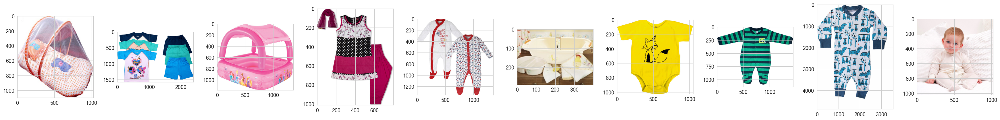

Beauty and Personal Care


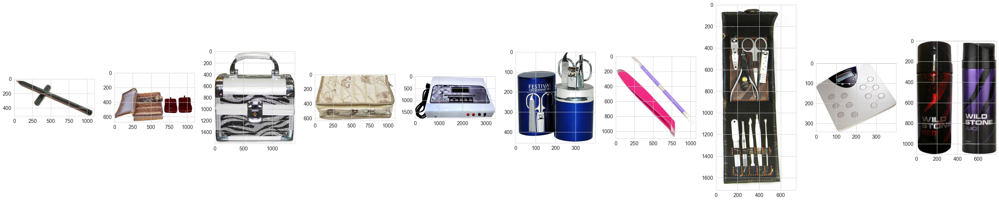

Computers


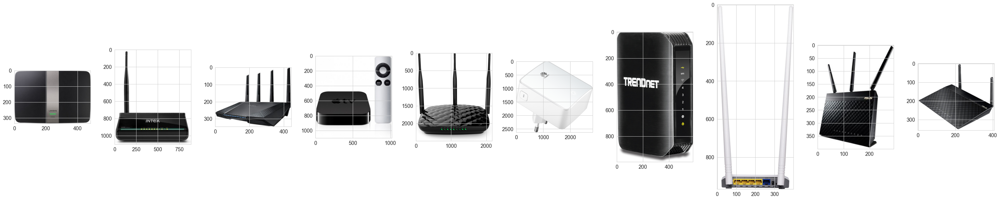

Home Decor & Festive Needs


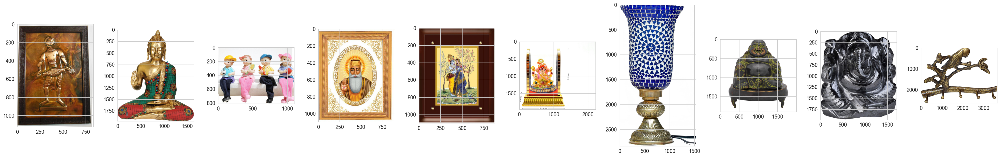

Home Furnishing


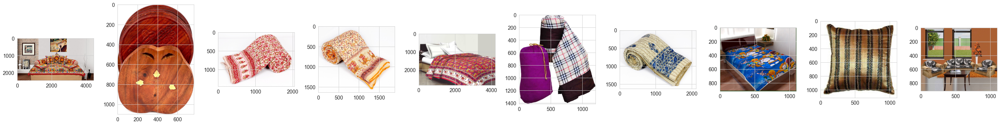

Kitchen & Dining


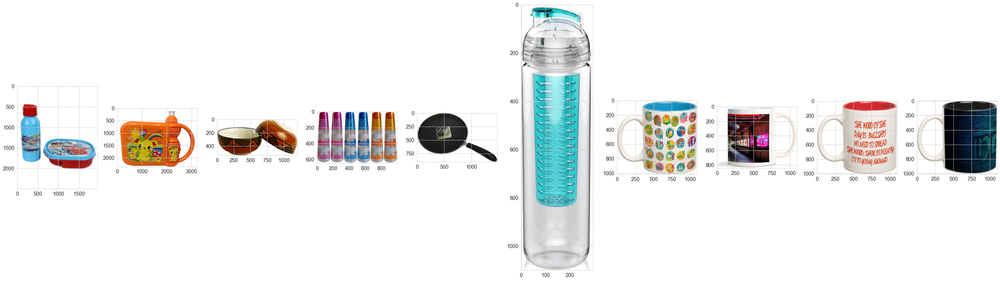

Watches


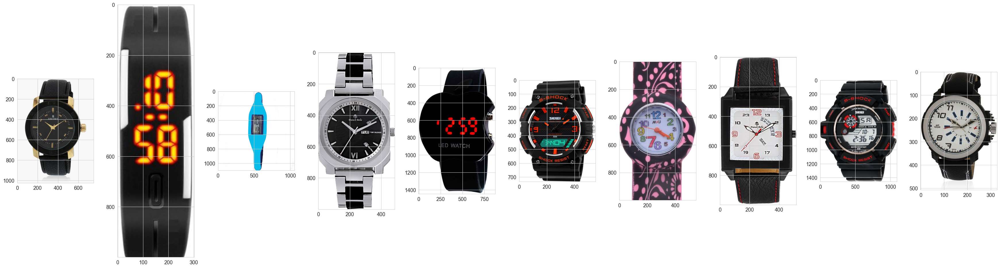

In [9]:
# Récupérer la liste des images par 'main_category' et Afficher un échantillon d'images de chaque catégorie
list_category = []

# Nombre de catégories uniques dans la colonne 'main_category'
len_cat = data['main_category'].nunique()

# Liste triée des catégories uniques
l_cat = np.sort(data['main_category'].unique()).tolist()

# Récupérer la liste des images par 'main_category'
for cat in range(len_cat):
    list_cat = [data["image"][i] for i in range(len(data)) if data["main_category_label"][i] == cat]
    list_category.append(list_cat)

# Afficher un échantillon d'images de chaque catégorie
for label, category in enumerate(l_cat):
    print(category)
    plt.figure(figsize=(35, 10))
    for i in range(10):
        plt.subplot(1, 10, i + 1)
        filename = path + list_category[label][i + 10]
        image = imread(filename)
        plt.imshow(image)
        plt.tight_layout()
    plt.show()

Premières observations :
* Au sein d'une même catégorie, il y a des objets détourés sur fond blanc, des objets en situation, des produits portés
* Les objets d'une même catégorie peuvent être très différents : exemple Baby care, Personnal care.
* Parfois, une même image contient plusieurs exemplaires d'un produit (exemple : Home Decor & Festive Needs, Kitchen & Dining)
* Les dimensions des images sont très différentes aussi d'un produit à l'autre.

### Taille des images

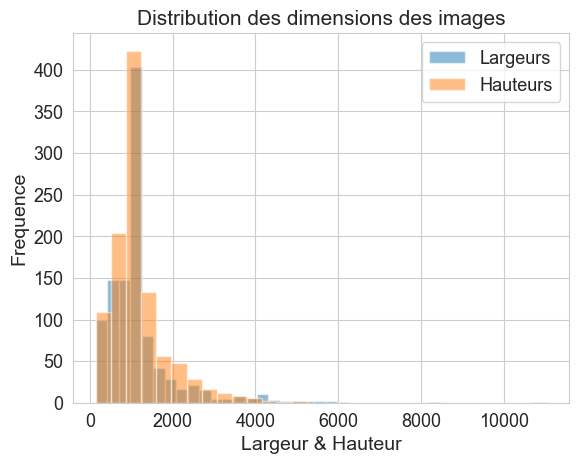

In [10]:
# Distribution des tailles des images 
dimensions = []
for img_file in data['image']:
    dimensions.append(imagesize.get(path + img_file))

widths, heights = zip(*dimensions)
data['width'] = widths
data['height'] = heights

plt.hist(data['width'], bins=30, alpha=0.5, label='Largeurs')
plt.hist(data['height'], bins=30, alpha=0.5, label='Hauteurs')
plt.legend(loc='upper right')
plt.title('Distribution des dimensions des images')
plt.xlabel('Largeur & Hauteur')
plt.ylabel('Frequence')
plt.show()

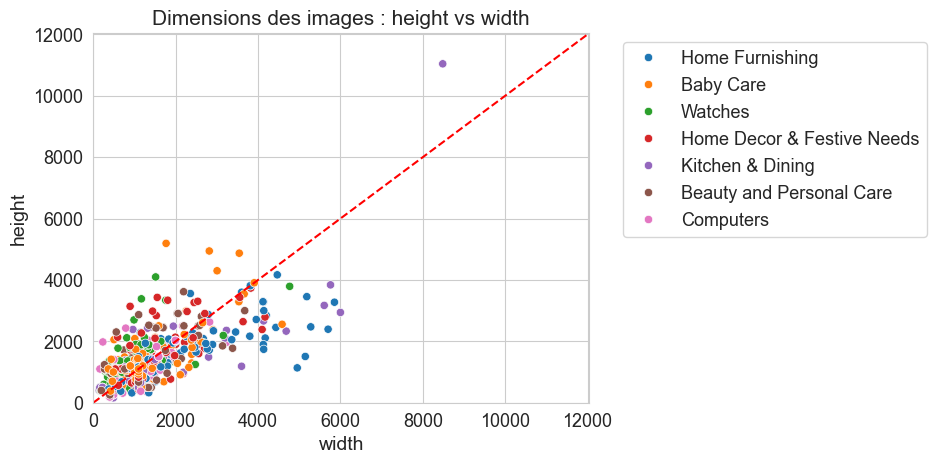

In [11]:
# Afficher les dimensions des images par catégorie
max_value = np.max(np.maximum(widths, heights))+1000

sns.scatterplot(data=data, x='width', y='height', hue=data['main_category'])

plt.plot([0, max_value], [0, max_value], color='red', linestyle='--')
plt.xlim(0,max_value)
plt.ylim(0,max_value)

plt.title('Dimensions des images : height vs width')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

Les images sont de dimensions différentes et majoritairement rectangulaires, quelque soit la catégorie. Nous observons un outlier. 

In [12]:
data.loc[data['height']==max(heights)]

,uniq_id,image,main_category,sub_category,main_category_label,width,height
677,5518124b75d6c6dfee4c2e4c0cfa716a,5518124b75d6c6dfee4c2e4c0cfa716a.jpg,Kitchen & Dining,Lighting,5,8484,11042


C:\Users\Adeline\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


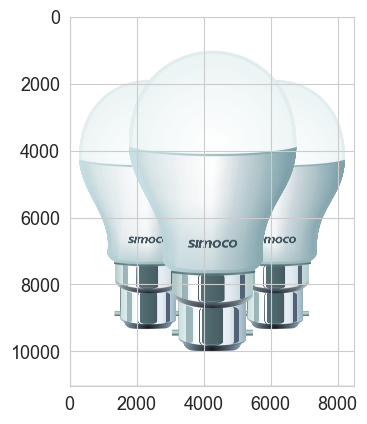

In [13]:
# Outlier en dimensions
max_height_index = heights.index(max(heights))
max_height_img_file = data['image'][max_height_index]
max_height_img_path = os.path.join(path, max_height_img_file)
max_height_img = imread(max_height_img_path)
plt.imshow(max_height_img)
plt.show()

### Couleurs prédominantes des images par catégorie

Pour l'analyse des couleurs prédominantes des images de chaque catégorie, le clustering k-means sera utilisé.

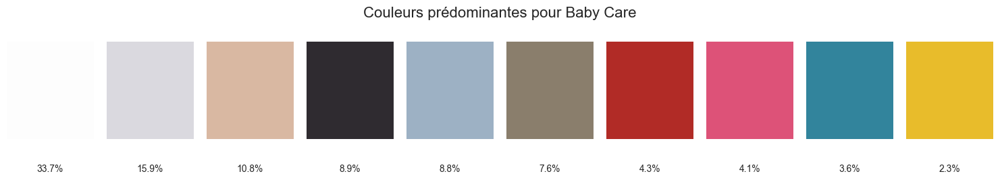

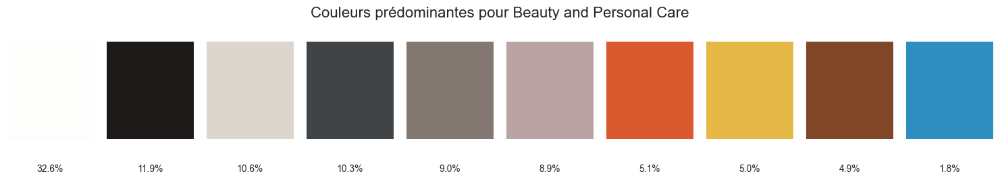

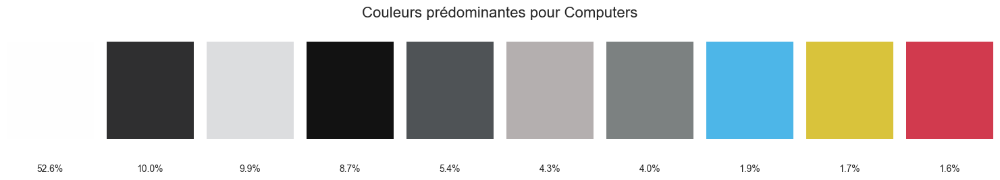

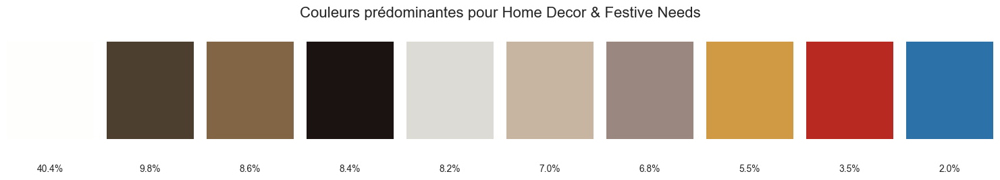

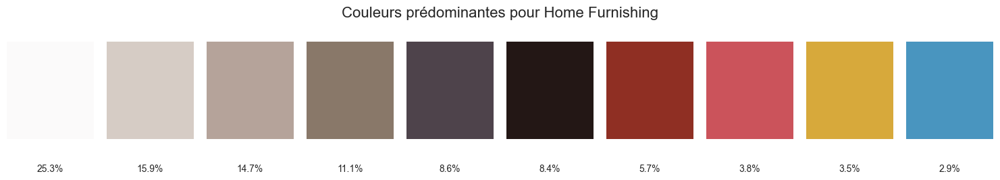

C:\Users\Adeline\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


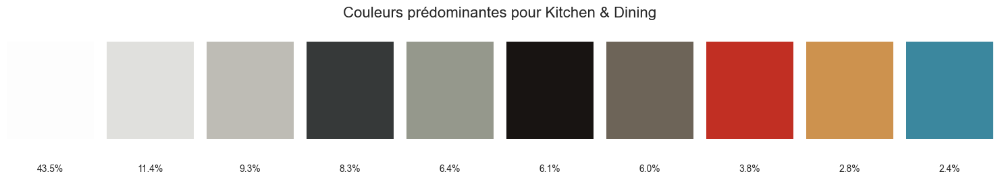

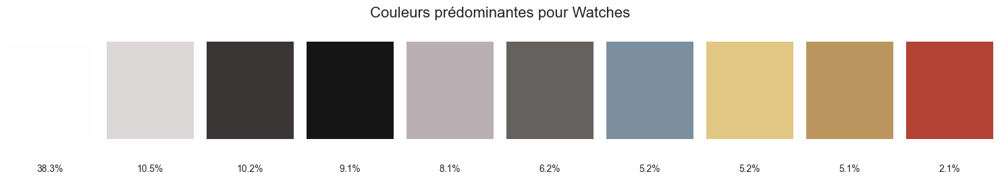

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn import cluster

# Paramètres
image_size = (100, 100)
n_colors = 10

for label, cat in enumerate(l_cat):  
    # Obtenir les chemins des images pour cette catégorie
    image_paths = [os.path.join(path, img_file) for img_file in list_category[label]]
    
    # Charger et préparer les données des images  
    all_pixels = []
    for image_path in image_paths:
        with Image.open(image_path) as img:
            img = img.convert("RGB")
            img = img.resize(image_size)
            pixels = np.array(img).reshape(-1, 3)
            all_pixels.append(pixels)

    pixels = np.concatenate(all_pixels, axis=0)
    
    # Appliquer K-Means pour trouver les couleurs prédominantes
    kmeans = cluster.KMeans(n_clusters=n_colors)
    kmeans.fit(pixels)
    
    # Obtenir les couleurs des centres des clusters
    colors = kmeans.cluster_centers_
    
    # Nombre de pixels par cluster
    unique, counts = np.unique(kmeans.labels_, return_counts=True)
    
    # Calculer les pourcentages
    percentages = counts / counts.sum() * 100
    
    # Trier les couleurs et les pourcentages par ordre de fréquence décroissante
    sorted_indices = np.argsort(percentages)[::-1]
    sorted_colors = colors[sorted_indices]
    sorted_percentages = percentages[sorted_indices]
    
    # Convertir les couleurs en valeurs entières
    sorted_colors = sorted_colors.round(0).astype(int)
    
    # Afficher les couleurs prédominantes avec pourcentages
    plt.figure(figsize=(15, 3))
    plt.suptitle(f'Couleurs prédominantes pour {cat}', fontsize=16)
    for i, (color, percentage) in enumerate(zip(sorted_colors, sorted_percentages)):
        plt.subplot(1, n_colors, i + 1)
        plt.imshow([[color]], aspect='auto')
        plt.axis('off')
        plt.text(0.5, -0.3, f'{percentage:.1f}%', fontsize=10, ha='center', va='center', transform=plt.gca().transAxes)
    plt.tight_layout()
    plt.show()


Le blanc est la couleur prédominante de toutes les catégories : c'est la couleur du fond de la majorité des images.
Les couleurs ne permettent pas de différencier les catérgories.

### Luminosité des images

C:\Users\Adeline\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


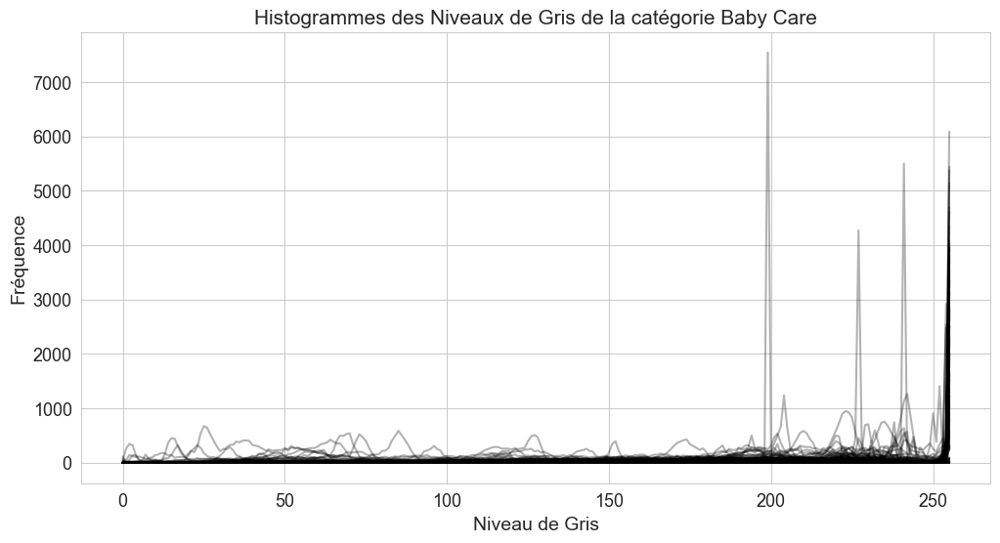

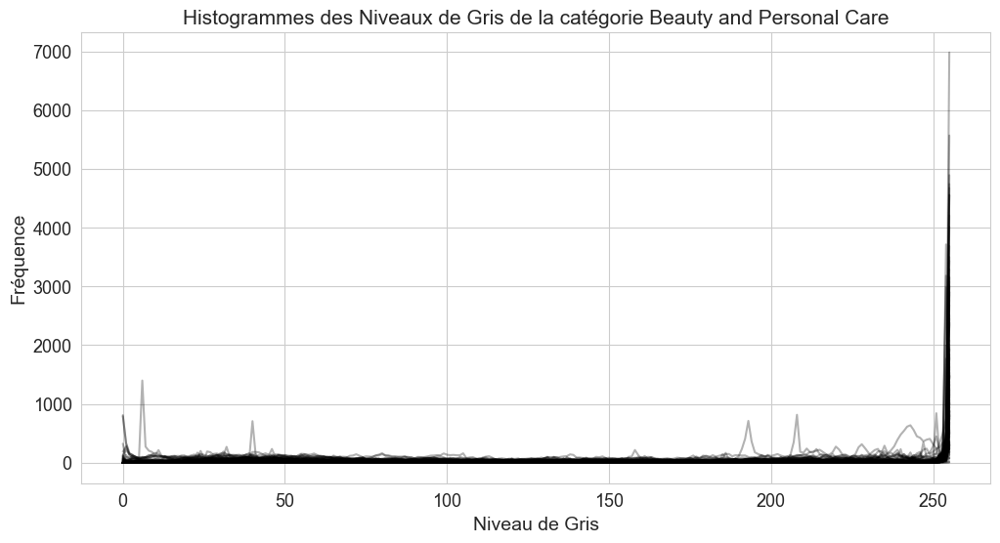

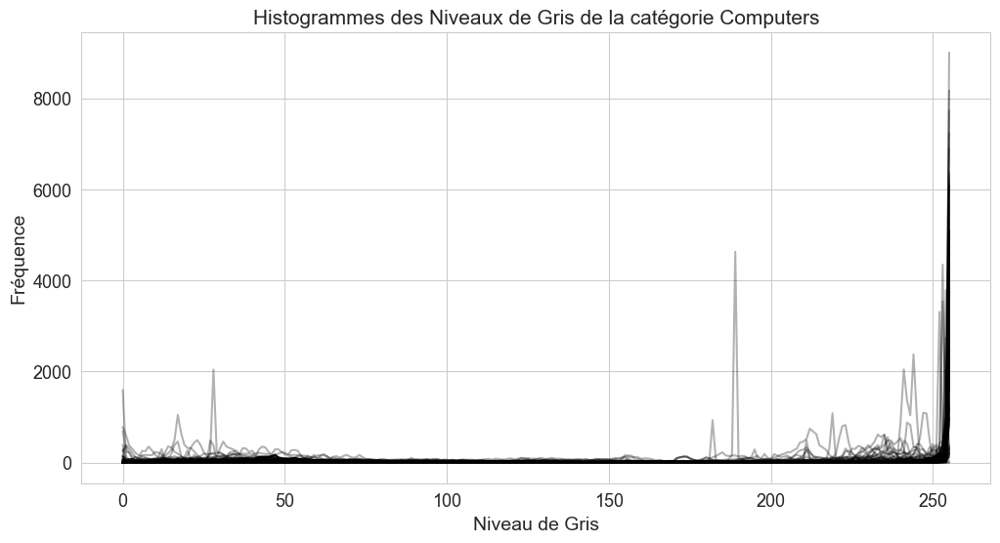

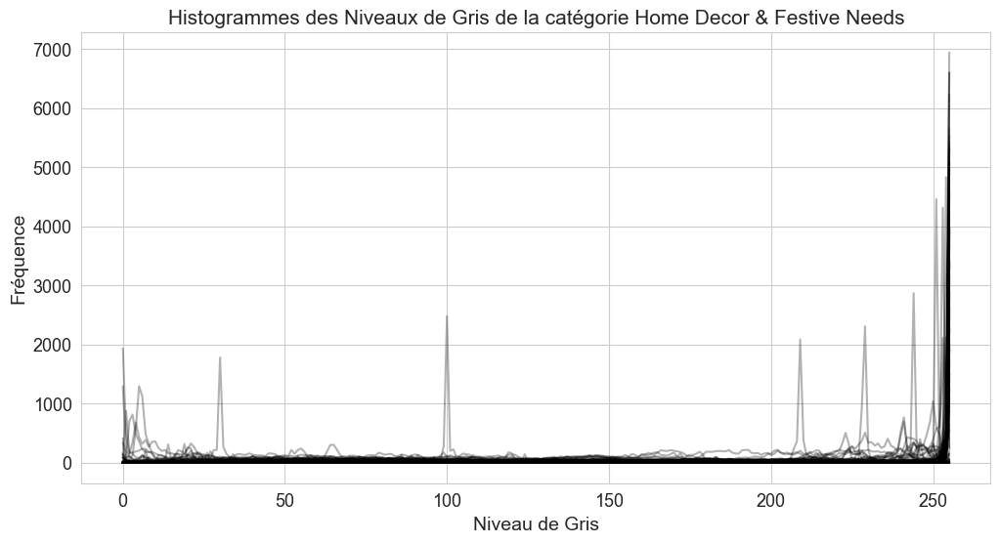

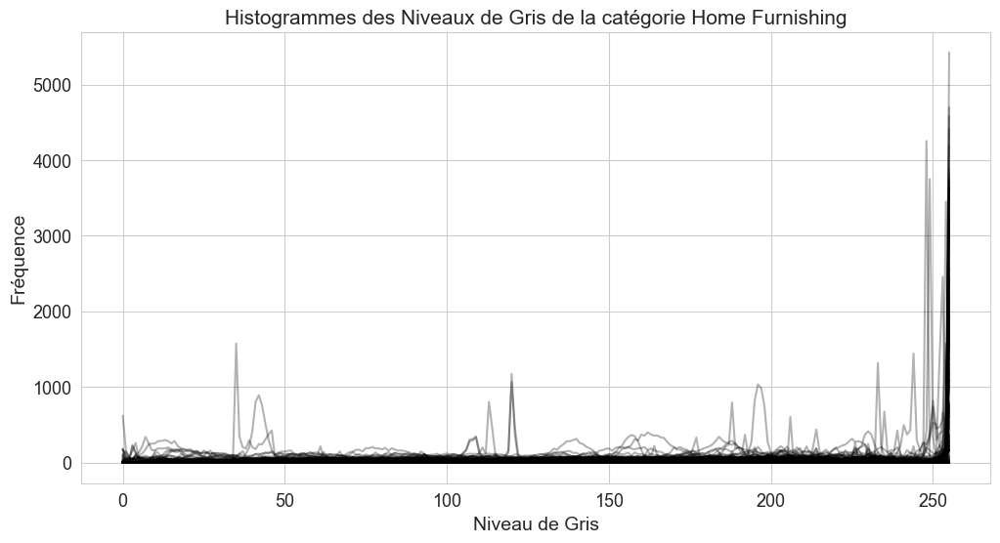

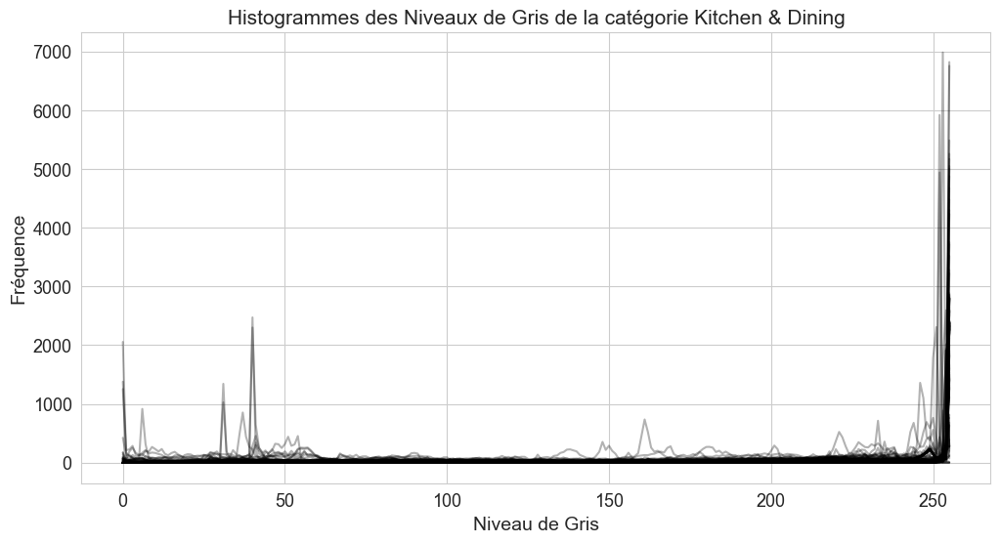

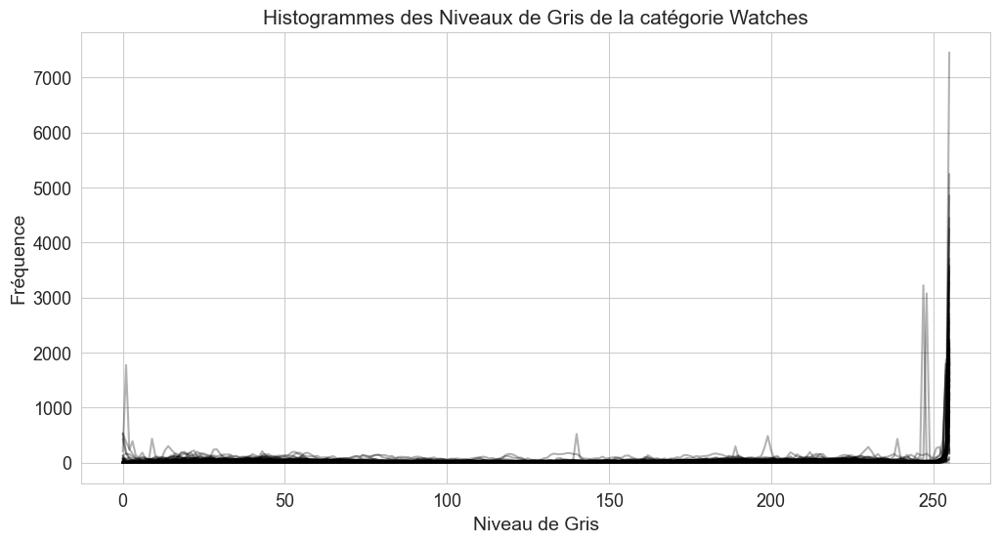

In [15]:
# Initialiser des dictionnaires pour accumuler les histogrammes par catégorie
category_histograms = {cat: [] for cat in l_cat}

# Taille maximale pour le redimensionnement
max_size = (100, 100)

# Parcourir les images par catégorie
for label, cat in enumerate(l_cat):
    for img_file in list_category[label]:
        img_path = os.path.join(path, img_file)
        with Image.open(img_path) as img:
            # Redimensionner l'image 
            img.thumbnail(max_size, Image.LANCZOS)
            # Conversion en niveau de gris
            gray_img = img.convert('L')
            # Obtenir l'histogramme de l'image
            hist = gray_img.histogram()
            # Ajouter l'histogramme à la liste de la catégorie
            category_histograms[cat].append(hist)

# Tracer les histogrammes pour toutes les images pour chaque catégorie
for category, histograms in category_histograms.items():
    # Tracer les histogrammes pour toutes les images
    plt.figure(figsize=(12, 6))
    for histogram in histograms:
        plt.plot(histogram, color='black', alpha=0.3)
    plt.title(f'Histogrammes des Niveaux de Gris de la catégorie {category}')
    plt.xlabel('Niveau de Gris')
    plt.ylabel('Fréquence')
    plt.show()

In [16]:
# Fonctions pour déterminer si une image est sur-exposée ou sous-exposée
def calculate_histogram(image_path):
    with Image.open(image_path) as img:
        gray_img = img.convert('L')  # Convertir en niveaux de gris
        histogram = np.array(gray_img.histogram())
    return histogram

# Image sous-exposée
def is_underexposed(histogram, threshold=0.8):
    underexposed_pixels = sum(histogram[:+100])  # Les 100 premières valeurs de l'histogramme
    total_pixels = sum(histogram)
    return (underexposed_pixels / total_pixels) > threshold

# Image sur-exposée
def is_overexposed(histogram, threshold=0.8):
    overexposed_pixels = sum(histogram[-100:])  # Les 100 dernières valeurs de l'histogramme
    total_pixels = sum(histogram)
    return (overexposed_pixels / total_pixels) > threshold

Nombre d'images surexposées dans la catégorie Baby Care: 69
Nombre d'images sousexposées dans la catégorie Baby Care: 2


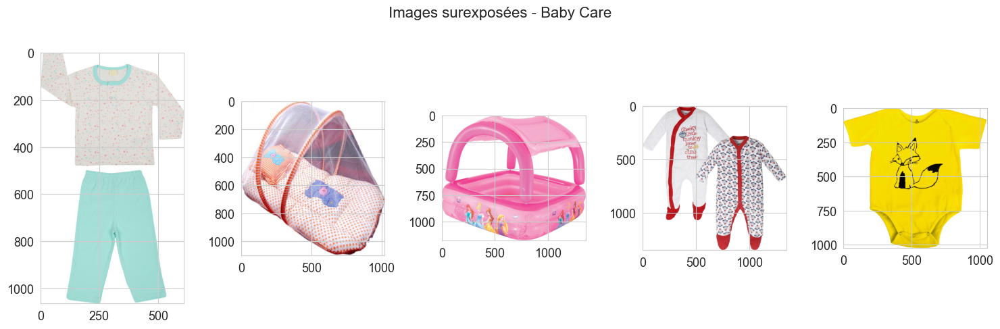

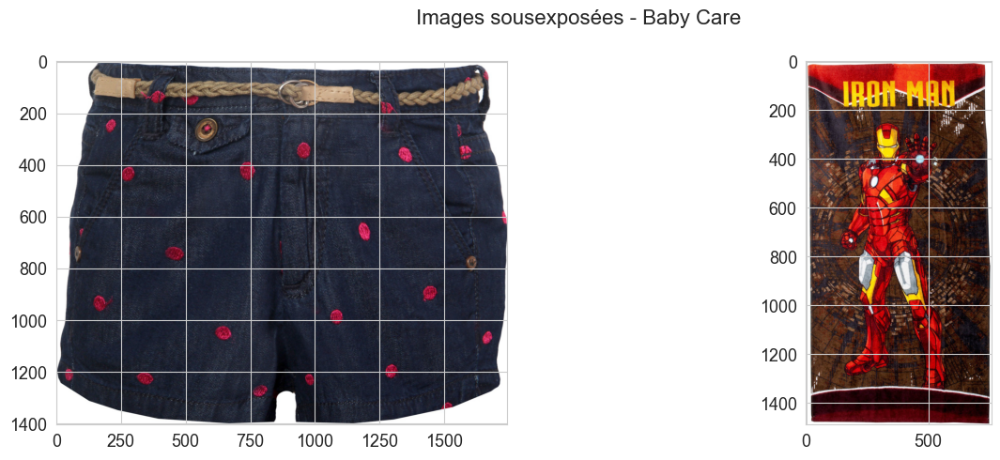

Nombre d'images surexposées dans la catégorie Beauty and Personal Care: 32
Nombre d'images sousexposées dans la catégorie Beauty and Personal Care: 0


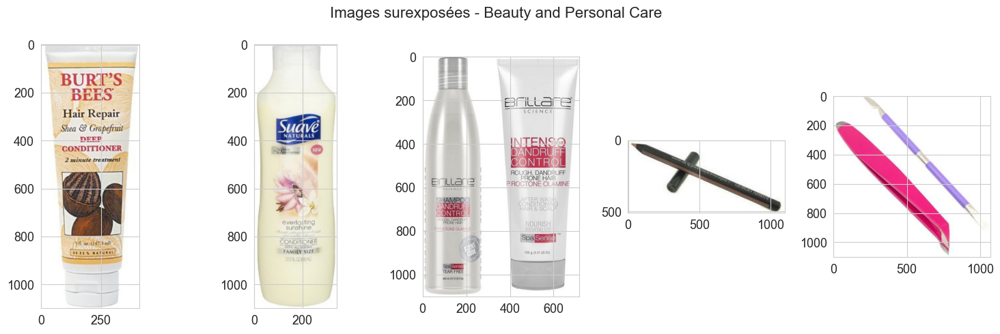

<Figure size 1500x500 with 0 Axes>

Nombre d'images surexposées dans la catégorie Computers: 55
Nombre d'images sousexposées dans la catégorie Computers: 4


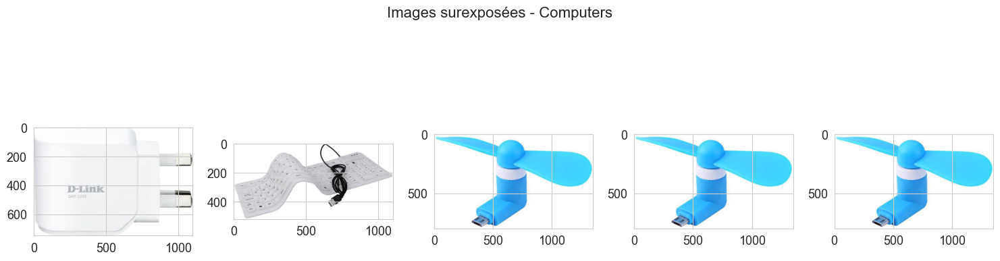

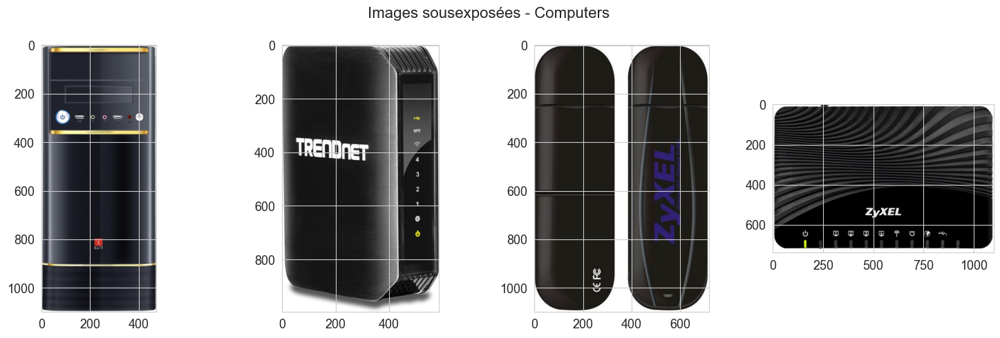

Nombre d'images surexposées dans la catégorie Home Decor & Festive Needs: 25
Nombre d'images sousexposées dans la catégorie Home Decor & Festive Needs: 3


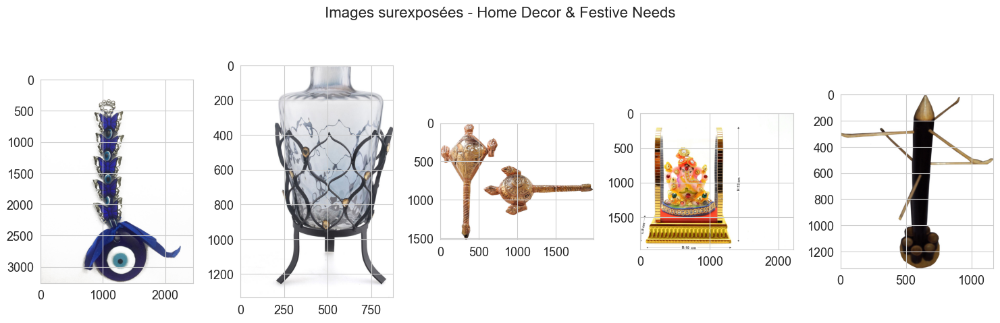

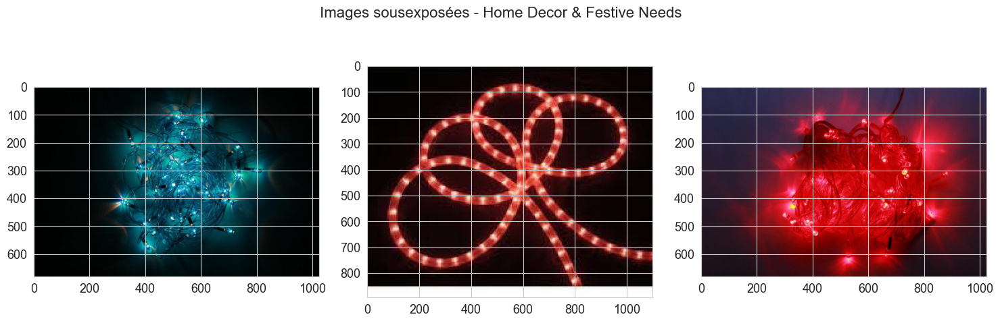

Nombre d'images surexposées dans la catégorie Home Furnishing: 23
Nombre d'images sousexposées dans la catégorie Home Furnishing: 0


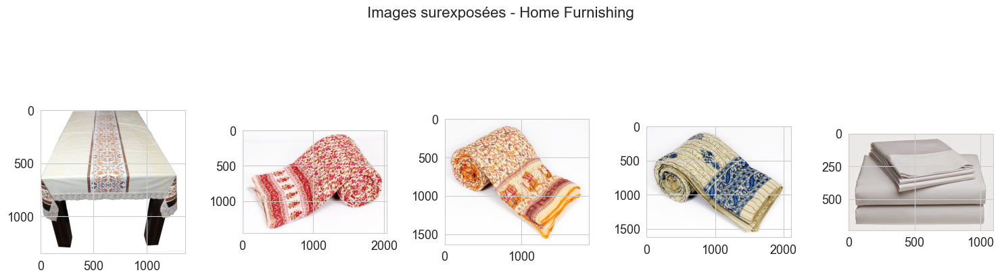

<Figure size 1500x500 with 0 Axes>

Nombre d'images surexposées dans la catégorie Kitchen & Dining: 49
Nombre d'images sousexposées dans la catégorie Kitchen & Dining: 0


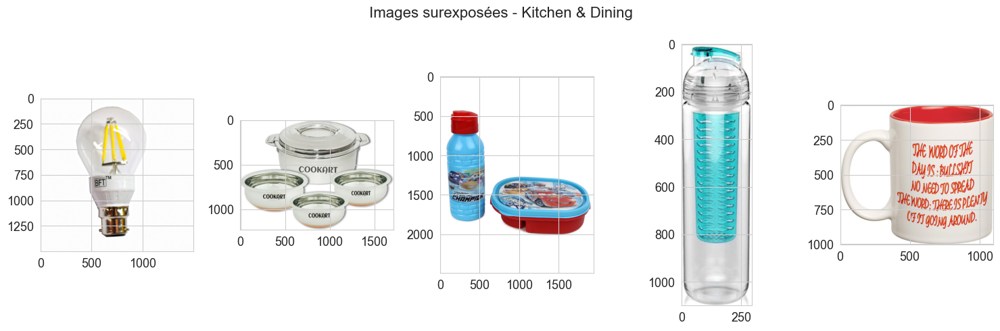

<Figure size 1500x500 with 0 Axes>

Nombre d'images surexposées dans la catégorie Watches: 43
Nombre d'images sousexposées dans la catégorie Watches: 0


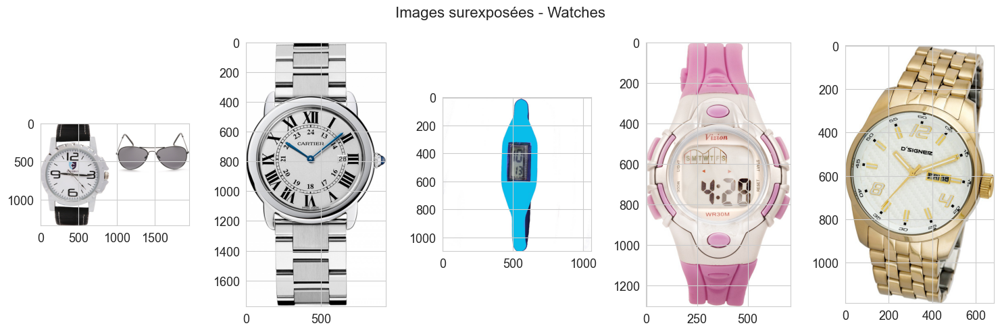

<Figure size 1500x500 with 0 Axes>

In [17]:
# Initialisation des dictionnairs
overexposed_img = {cat : [] for cat in l_cat}
underexposed_img = {cat : [] for cat in l_cat}

# Parcourir chaque catégorie
for label, cat in enumerate(l_cat):
    # Obtenir les chemins des images pour cette catégorie
    image_paths = [os.path.join(path, img_file) for img_file in list_category[label]]
    
    for image_path in image_paths:
        # Calculer l'histogramme de l'image
        histogram = calculate_histogram(image_path)
        if is_overexposed(histogram):
            overexposed_img[cat].append(image_path)
        elif is_underexposed(histogram):
            underexposed_img[cat].append(image_path)
    print(f"Nombre d'images surexposées dans la catégorie {cat}: {len(overexposed_img[cat])}")
    print(f"Nombre d'images sousexposées dans la catégorie {cat}: {len(underexposed_img[cat])}")   
    
    # Afficher les premières images surexposées de cette catégorie
    if len(overexposed_img[cat]) >= 5:
        nb_plots = 5
    else:
        nb_plots = len(overexposed_img[cat])
        
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Images surexposées - {cat}', fontsize=16)
    for idx, img_path in enumerate(overexposed_img[cat][:nb_plots]):
        with Image.open(img_path) as img:
            plt.subplot(1, nb_plots, idx + 1)
            plt.imshow(img)
    plt.tight_layout()
    plt.show()
    
    # Afficher les premières images sousexposées de cette catégorie
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Images sousexposées - {cat}', fontsize=16)
    
    if len(underexposed_img[cat]) >= 5:
        nb_plots = 5
    else:
        nb_plots = len(underexposed_img[cat])
        
    for idx, img_path in enumerate(underexposed_img[cat][:nb_plots]):
        with Image.open(img_path) as img:
            plt.subplot(1, nb_plots, idx + 1)
            plt.imshow(img)
    plt.tight_layout()
    plt.show()

Il y a plusieurs images sur-exposées dans chacune des catégories.

### Bruit

In [18]:
# Fonctions pour détecter la présence de bruit dans les images
def calculate_local_variance(image, kernel_size=3):
    """
    Calcule la variance locale de l'image en utilisant un filtre de taille kernel_size x kernel_size.
    """
    image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    mean = cv2.blur(image_gray, (kernel_size, kernel_size))
    mean_sq = cv2.blur(image_gray**2, (kernel_size, kernel_size))
    variance = mean_sq - mean**2
    return variance

def is_noisy(image_path, threshold=500):
    """
    Détecte si une image est bruyante en comparant la variance locale avec un seuil.
    """
    with Image.open(img_path) as img:          
            # Convertir l'image PIL en tableau NumPy
            image_np = np.array(img)
            
            # Si l'image a un canal alpha, le retirer
            if image_np.shape[-1] == 4:
                image_np = image_np[:, :, :3]
            
            image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

    variance = calculate_local_variance(image_bgr)
    noise_level = np.mean(variance)
    return noise_level > threshold


In [19]:
# Dictionnaire pour stocker les images bruitées
noisy_img = {cat: [] for cat in l_cat}

# Parcourir chaque catégorie
for label, cat in enumerate(l_cat):
    print(f"Traitement de la catégorie: {cat}")
    
    # Obtenir les chemins des images pour cette catégorie
    image_paths = [os.path.join(path, img_file) for img_file in list_category[label]]
    
    for image_path in image_paths:
        if is_noisy(image_path):
            noisy_img[cat].append(image_path)
    
    print(f"Nombre d'images bruitées dans la catégorie {cat}: {len(noisy_img[cat])}")
    
    # Afficher les 5 premières images bruitées de cette catégorie côte à côte
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Images bruitées - {cat}', fontsize=16)
    for idx, img_path in enumerate(noisy_img[cat][:5]):
        with Image.open(img_path) as img:
            plt.subplot(1, 5, idx + 1)
            plt.imshow(img)
            plt.title(f'Image {idx + 1}')
            plt.axis('off')
    plt.tight_layout()
    plt.show()

Traitement de la catégorie: Baby Care
Nombre d'images bruitées dans la catégorie Baby Care: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Beauty and Personal Care
Nombre d'images bruitées dans la catégorie Beauty and Personal Care: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Computers
Nombre d'images bruitées dans la catégorie Computers: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Home Decor & Festive Needs
Nombre d'images bruitées dans la catégorie Home Decor & Festive Needs: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Home Furnishing
Nombre d'images bruitées dans la catégorie Home Furnishing: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Kitchen & Dining
Nombre d'images bruitées dans la catégorie Kitchen & Dining: 0


<Figure size 1500x500 with 0 Axes>

Traitement de la catégorie: Watches
Nombre d'images bruitées dans la catégorie Watches: 0


<Figure size 1500x500 with 0 Axes>

Il n'y a aucune image avec du bruit détectées dans aucune des catégories.

## <font color='#46abe6'>Pré-traitement<a class="anchor" id="2_2"></a></font>

Test de pré-traitement des images

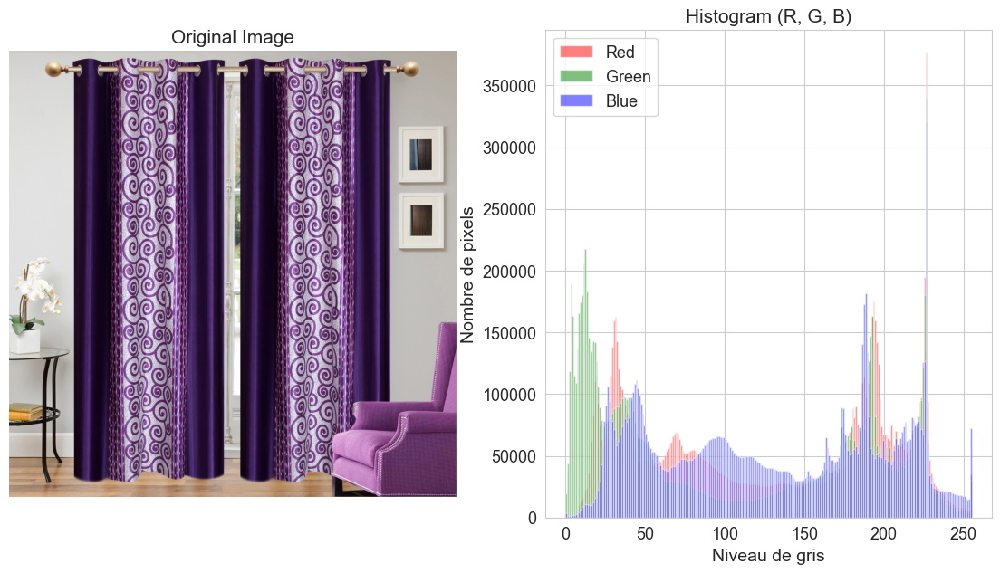

In [20]:
# =================
# Image originale
#=================

# Chemin vers l'image
img_path = path + data['image'][0]

# Ouverture de l'image et conversion en matrice de pixels
img = Image.open(img_path)

# Affichage de l'image pour référence
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# Séparer les canaux R, G, B
r, g, b = img.split()

# Générer et afficher les histogrammes pour chaque canal
plt.subplot(1, 2, 2)
plt.hist(np.array(r).flatten(), bins=range(256), color='red', alpha=0.5, label='Red')
plt.hist(np.array(g).flatten(), bins=range(256), color='green', alpha=0.5, label='Green')
plt.hist(np.array(b).flatten(), bins=range(256), color='blue', alpha=0.5, label='Blue')
plt.title('Histogram (R, G, B)')
plt.xlabel('Niveau de gris')
plt.ylabel('Nombre de pixels')
plt.legend()

# Affichage des graphiques
plt.show()

### Conversion en niveau de gris

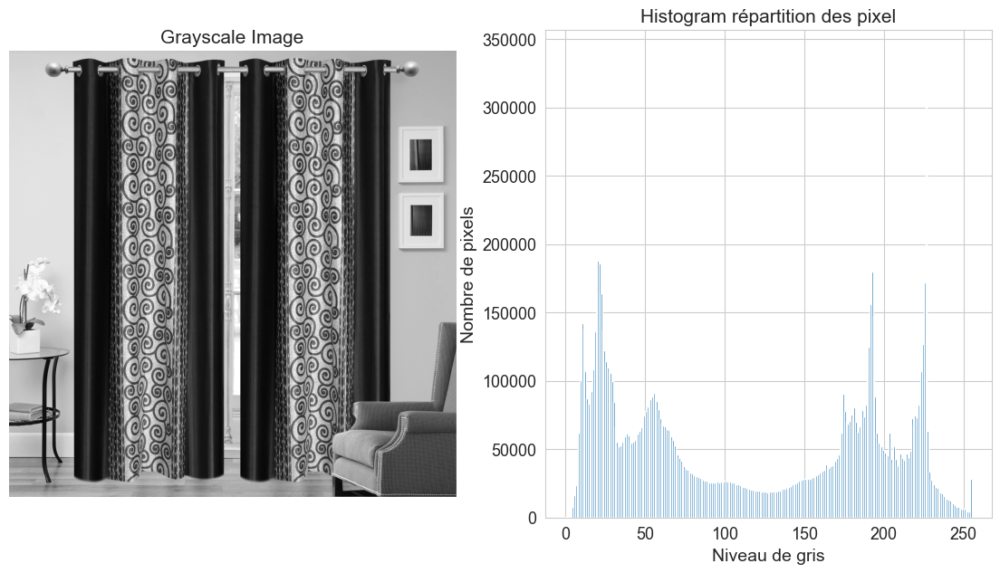

In [21]:
#=============================
# Conversion en niveau de gris
#=============================
gray_img = img.convert('L')

# Affichage de l'image pour référence
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')


# Générer et afficher l'histogramme
plt.subplot(1, 2, 2)
plt.hist(np.array(gray_img).flatten(), bins=range(256))
plt.title('Histogram répartition des pixel')
plt.xlabel('Niveau de gris')
plt.ylabel('Nombre de pixels')

# Affichage des graphiques
plt.show()

### Etirement de l'histogramme - homogénéiser la luminosité
>**Maximize (normalize) image contrast**
>PIL.ImageOps.autocontrast(image: Image, cutoff: float, ignore: int) :
>This function calculates a histogram of the input image (or mask region), removes cutoff percent of the lightest and darkest pixels from the histogram, and remaps the image so that the darkest pixel becomes black (0), and the lightest becomes white (255)
>[Sources](https://pillow.readthedocs.io/en/stable/reference/ImageOps.html)

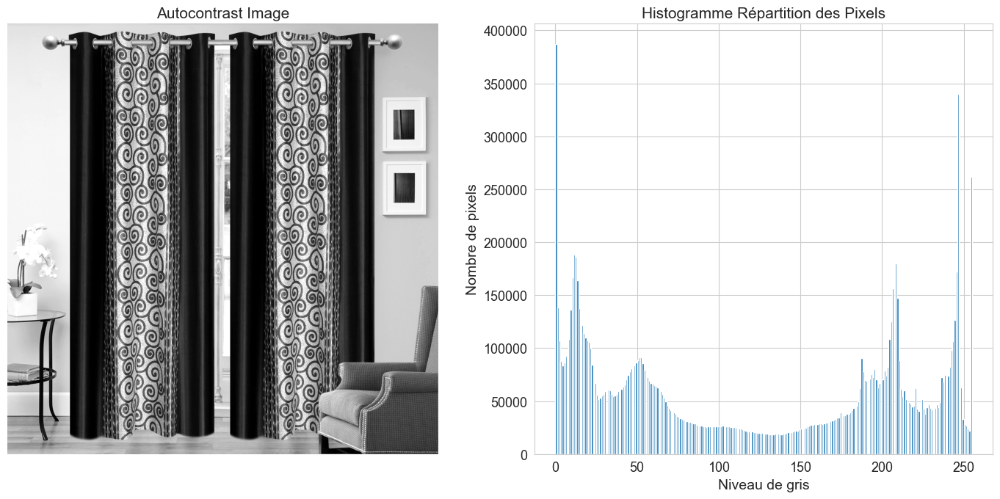

In [22]:
#======================================================================
# Etirement de l'histogramme - homogénéiser la luminosité (non utilisé)
#======================================================================

contrast_img = ImageOps.autocontrast(gray_img, cutoff=2, ignore=2)

# Affichage de l'image après Etirement de l'histogramme - homogénéiser la luminosité
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(contrast_img, cmap='gray')
plt.title('Autocontrast Image')
plt.axis('off')

# Histogramme de l'image après Etirement de l'histogramme - homogénéiser la luminosité
plt.subplot(1, 2, 2)
plt.hist(np.array(contrast_img).flatten(), bins=range(256))
plt.title('Histogramme Répartition des Pixels')
plt.xlabel('Niveau de gris')
plt.ylabel('Nombre de pixels')

# Affichage des graphiques
plt.tight_layout()
plt.show()

### Réajuster le contraste de l'image
>**Equalize the image histogram**
>PIL.ImageOps.equalize(image: Image, mask: None) :
>This function applies a non-linear mapping to the input image, in order to create a uniform distribution of grayscale values in the output image.
>[Sources](https://pillow.readthedocs.io/en/stable/reference/ImageOps.html)

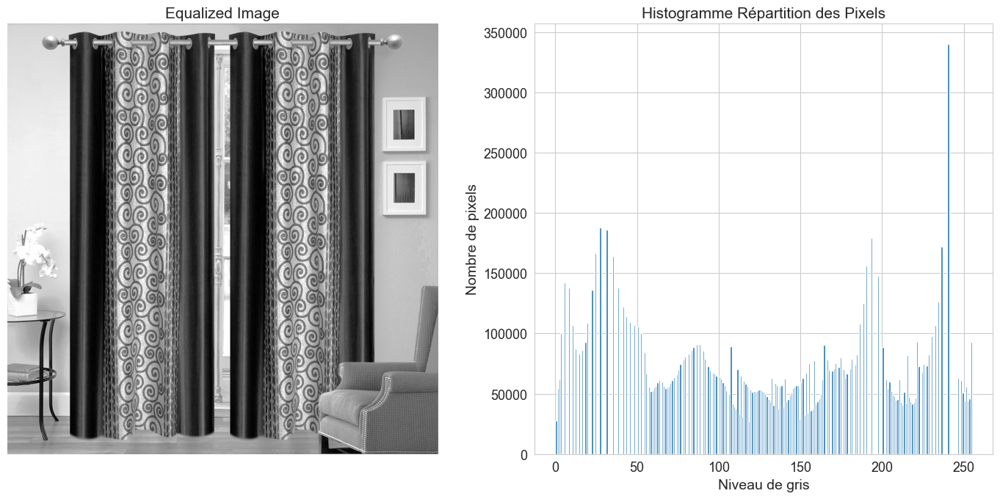

In [23]:
#====================================
# Réajuster le contraste de l'image
#====================================

equalized_img = ImageOps.equalize(gray_img, mask=None) 

plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(equalized_img, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

# Histogramme de l'image après l'égalisation du contraste
plt.subplot(1, 2, 2)
plt.hist(np.array(equalized_img).flatten(), bins=range(256))
plt.title('Histogramme Répartition des Pixels')
plt.xlabel('Niveau de gris')
plt.ylabel('Nombre de pixels')

# Affichage des graphiques
plt.tight_layout()
plt.show()

### Redimensionner de l'image

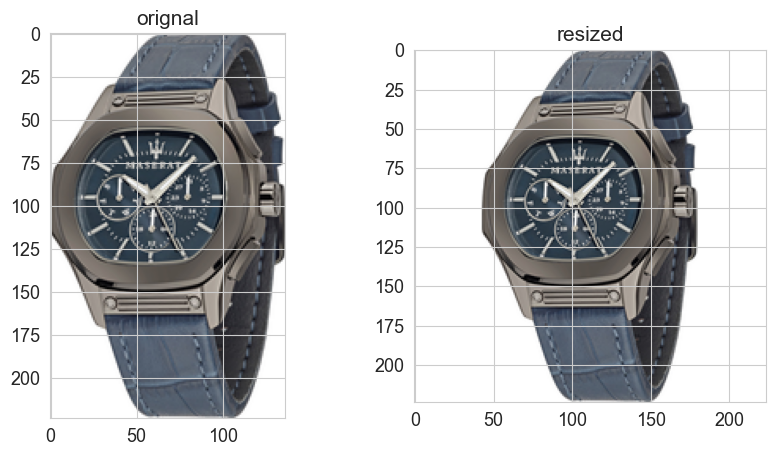

In [24]:
# Taille cible pour le redimensionnement
target_size = (224, 224)

def resize_and_pad(img, size, color=(255, 255, 255)):
    img.thumbnail(size, Image.LANCZOS)
    delta_w = size[0] - img.size[0]
    delta_h = size[1] - img.size[1]
    padding = (delta_w // 2, delta_h // 2, delta_w - (delta_w // 2), delta_h - (delta_h // 2))
    return ImageOps.expand(img, padding, fill=color)

# Chemin vers l'image
img_path = path + data['image'][5]
with Image.open(img_path) as img:
        # Redimensionner l'image
        resized_img = resize_and_pad(img, target_size)

fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(img); ax[0].set_title('orignal')
ax[1].imshow(resized_img); ax[1].set_title('resized')
plt.show()

Du blanc est ajouté autour de l'image : cela ne conviendrait pas au image en situation.

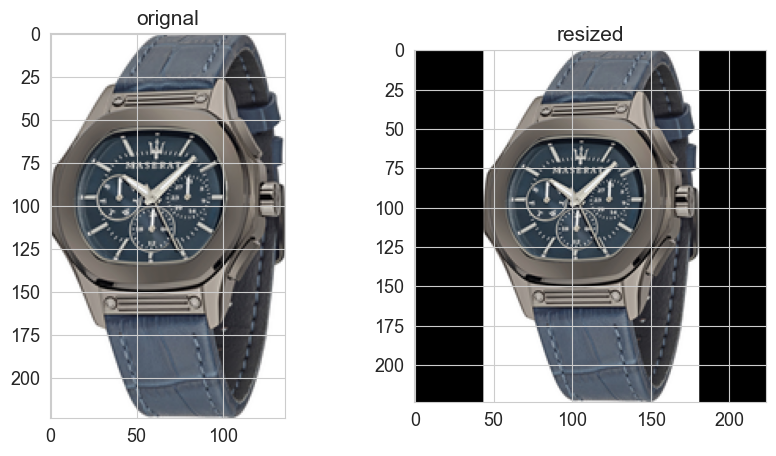

In [25]:
img = Image.open(img_path)

# Définir la taille cible
target_size = (224, 224)

def resize_and_crop_image(img, target_size):
    # Redimensionner l'image en conservant le rapport d'aspect
    img.thumbnail((target_size[0], target_size[1]), Image.LANCZOS)
    
    # Calculer les coordonnées de recadrage pour centrer l'image
    width, height = img.size
    left = (width - target_size[0]) / 2
    top = (height - target_size[1]) / 2
    right = (width + target_size[0]) / 2
    bottom = (height + target_size[1]) / 2
    
    # Recadrer l'image
    img = img.crop((left, top, right, bottom))
    
    return img

# Appliquer la fonction de redimensionnement et de recadrage
resized_cropped_img = resize_and_crop_image(img, target_size)

# Afficher l'image traitée
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(img); ax[0].set_title('orignal')
ax[1].imshow(resized_cropped_img); ax[1].set_title('resized')
plt.show()

En conservant le rapport d'aspect initial de l'image, du noir est ajouté autour. Cela ne conviendrait pas au image en situation.

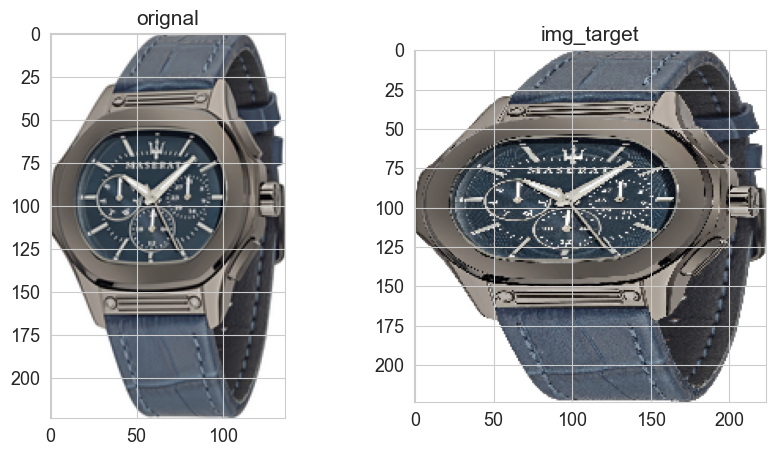

In [26]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

img_target = load_img(img_path, target_size=(224, 224))

# Afficher l'image traitée
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(img); ax[0].set_title('orignal')
ax[1].imshow(img_target); ax[1].set_title('img_target')
plt.show()

Le chargement de l'image avec définition de la target_size entraîne une déformation de l'image. Cependant, la partie d'intérêt reste au centre de l'image.

## <font color='#46abe6'>Essais de transformation<a class="anchor" id="2_3"></a></font>

In [27]:
test_image = imread(max_height_img_path)

C:\Users\Adeline\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


### Rotation

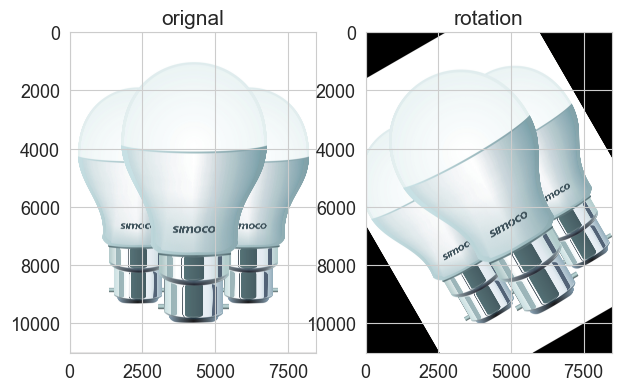

In [28]:
# Rotation
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
rotated_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

fig, ax = plt.subplots(1,2, figsize=(7,5))
ax[0].imshow(test_image); ax[0].set_title('orignal')
ax[1].imshow(rotated_image); ax[1].set_title('rotation')
plt.show()

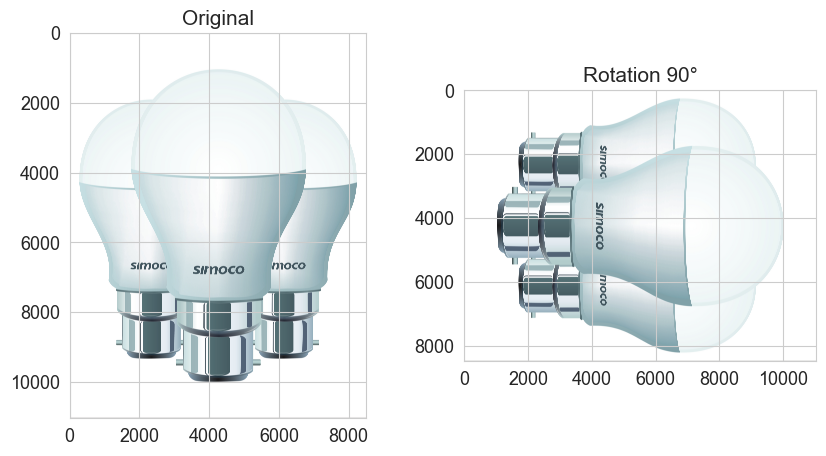

In [29]:
# Taille de l'image
num_rows, num_cols = test_image.shape[:2]

# Rotation de 90° (horaire)
rotated_image_90 = cv2.rotate(test_image, cv2.ROTATE_90_CLOCKWISE)

# Affichage des images
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(test_image)
ax[0].set_title('Original')
ax[1].imshow(rotated_image_90)
ax[1].set_title('Rotation 90°')
plt.show()

Une rotation à 90° permet de ne pas ajouter de noir.

### Zoom

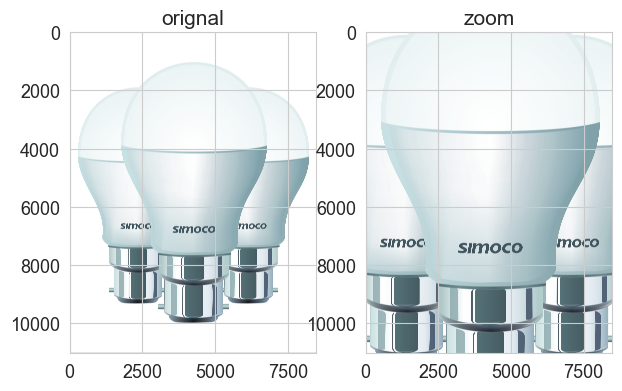

In [30]:
# Zoom
def zoom_center(img, zoom_factor=1.5):

    y_size = img.shape[0]
    x_size = img.shape[1]
    
    # define new boundaries
    x1 = int(0.5*x_size*(1-1/zoom_factor))
    x2 = int(x_size-0.5*x_size*(1-1/zoom_factor))
    y1 = int(0.5*y_size*(1-1/zoom_factor))
    y2 = int(y_size-0.5*y_size*(1-1/zoom_factor))

    # first crop image then scale
    img_cropped = img[y1:y2,x1:x2]
    return cv2.resize(img_cropped, None, fx=zoom_factor, fy=zoom_factor)

# call our function
img_zoomed_and_cropped = zoom_center(test_image)

fig, ax = plt.subplots(1,2, figsize=(7,5))
ax[0].imshow(test_image); ax[0].set_title('orignal')
ax[1].imshow(img_zoomed_and_cropped); ax[1].set_title('zoom')
plt.show()

### Miroir

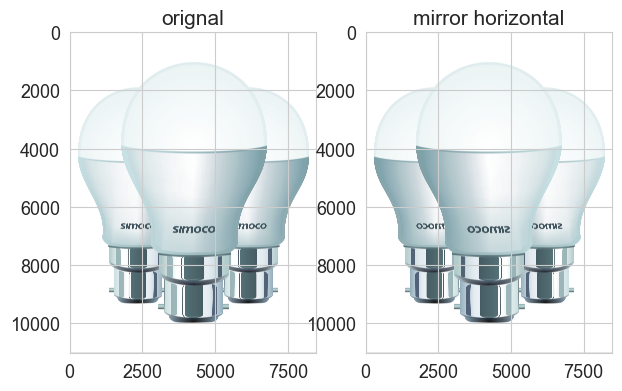

In [32]:
# Appliquer un effet miroir horizontal (flip horizontal)
image_mirror_horizontal = cv2.flip(test_image, 1)

fig, ax = plt.subplots(1,2, figsize=(7,5))
ax[0].imshow(test_image); ax[0].set_title('orignal')
ax[1].imshow(image_mirror_horizontal); ax[1].set_title('mirror horizontal')
plt.show()

### Ajout de bruit

In [ ]:
mean = 0
std = 0.1
gaussian_noise = np.random.normal(mean, std, test_image.shape).astype('uint8')
noisy_image = cv2.addWeighted(test_image, 0.75, gaussian_noise, 0.25, 0)

fig, ax = plt.subplots(1,2, figsize=(7,5))
ax[0].imshow(test_image); ax[0].set_title('orignal')
ax[1].imshow(noisy_image); ax[1].set_title('gaussian_noise')
plt.show()

# <font color='#0a389f'>Conclusion<a class="anchor" id="3"></a></font>

Résultats de l'analyse exploratoire :
* Au sein d'une même catégorie, il y a des objets détourés sur fond blanc, des objets en situation, des produits portés
* Les objets d'une même catégorie peuvent être très différents : exemple Baby care, Personnal care.
* Parfois, une même image contient plusieurs exemplaires d'un produit (exemple : Home Decor & Festive Needs, Kitchen & Dining)
* Les dimensions des images sont très différentes aussi d'un produit à l'autre.
* Le blanc est la couleur prédominante de toutes les catégories : c'est la couleur du fond de la majorité des images.
Les couleurs ne permettent pas de différencier les catérgories.
* Il y a plusieurs images sur-exposées dans chacune des catégories.
* Il n'y a aucune image avec du bruit détectées dans aucune des catégories.

Les pré-traitements envisageables pour les images sont : 
* conversion en niveau de gris
* reajustement du contraste 

Pour la data augmentation, les transformations possibles sont :
* rotation 90°
* miroir horizontal

Les images actuelles ne contiennent pas de bruit et sont bien cadrées : l'ajout de bruit n'est pas une transformation qui apporterait au modèle.